## IMPORT DATA

In [6]:
import pandas as pd
df=pd.read_csv('merged_data2205.csv')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23309 entries, 0 to 23308
Data columns (total 34 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   NUM_ROU          23309 non-null  int64  
 1   CLASSE_ISR       23309 non-null  int64  
 2   COD_PRV          23309 non-null  int64  
 3   Victimes         23309 non-null  int64  
 4   NUM_ACC          23309 non-null  int64  
 5   MOIS_ACC         23309 non-null  int64  
 6   PKM              23309 non-null  int64  
 7   TMJA_en_veh_j    23309 non-null  int64  
 8   HEU_ACC          23309 non-null  int64  
 9   COD_ETA_CHA      23309 non-null  int64  
 10  COD_ETA_SUR      23309 non-null  int64  
 11  COD_LUM          23309 non-null  int64  
 12  COD_INT          23309 non-null  int64  
 13  COD_TYP_CHA      23309 non-null  int64  
 14  POS_ACO_DRO      23309 non-null  int64  
 15  POS_ACO_GAU      23309 non-null  int64  
 16  SIG_HOR          23309 non-null  int64  
 17  SIG_VER     

In [8]:
import pandas as pd
df = pd.read_csv('merged_data2205.csv')
df1 = df.drop(columns=['COD_MAN'])
df1.to_csv('merged_data22054.csv', index=False)
df1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23309 entries, 0 to 23308
Data columns (total 33 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   NUM_ROU          23309 non-null  int64  
 1   CLASSE_ISR       23309 non-null  int64  
 2   COD_PRV          23309 non-null  int64  
 3   Victimes         23309 non-null  int64  
 4   NUM_ACC          23309 non-null  int64  
 5   MOIS_ACC         23309 non-null  int64  
 6   PKM              23309 non-null  int64  
 7   TMJA_en_veh_j    23309 non-null  int64  
 8   HEU_ACC          23309 non-null  int64  
 9   COD_ETA_CHA      23309 non-null  int64  
 10  COD_ETA_SUR      23309 non-null  int64  
 11  COD_LUM          23309 non-null  int64  
 12  COD_INT          23309 non-null  int64  
 13  COD_TYP_CHA      23309 non-null  int64  
 14  POS_ACO_DRO      23309 non-null  int64  
 15  POS_ACO_GAU      23309 non-null  int64  
 16  SIG_HOR          23309 non-null  int64  
 17  SIG_VER     

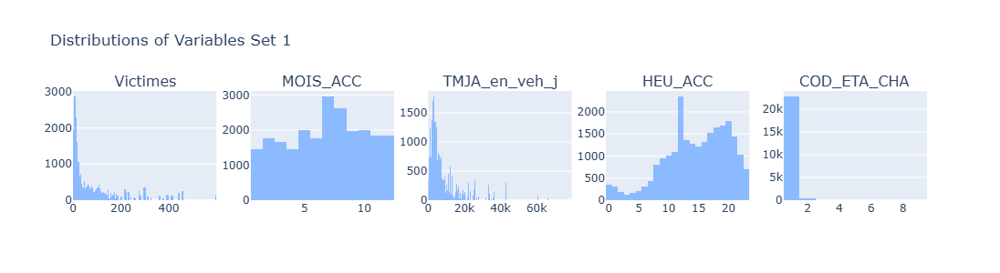

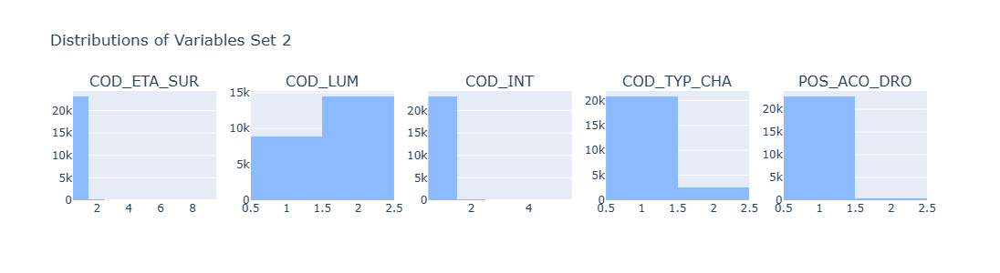

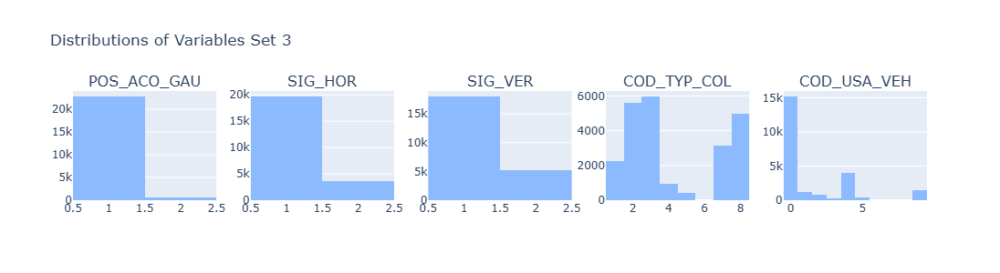

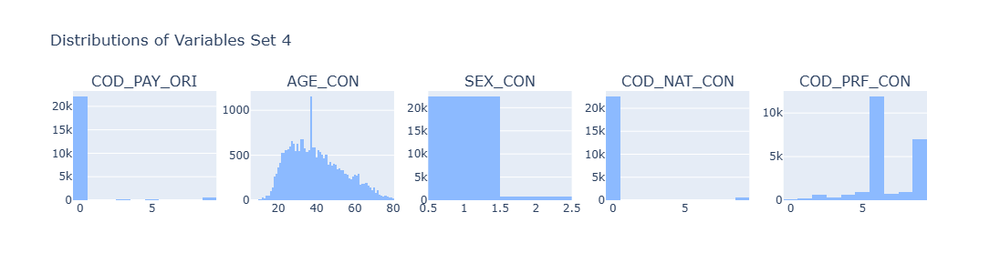

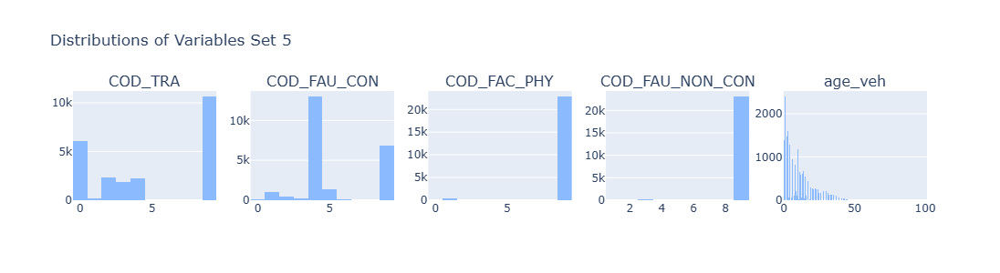

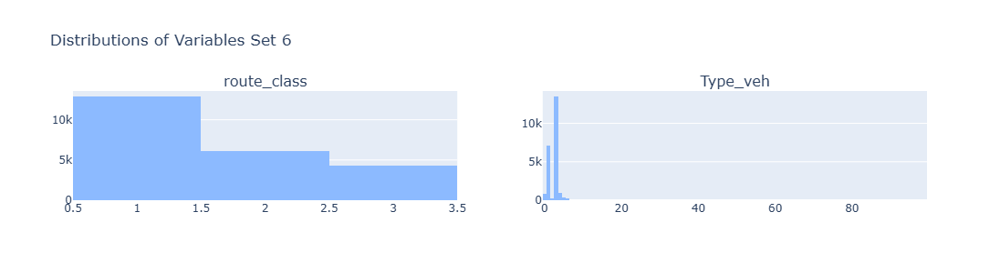

In [10]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
df = pd.read_csv('merged_data22054.csv')
exclude_columns = ['NUM_ACC', 'PKM', 'COD_PRV','CLASSE_ISR', 'NUM_ROU', 'id_vehicule','Unnamed: 0']
df_filtered = df.drop(columns=exclude_columns, errors='ignore')
color = '#8cbaff'
features = [col for col in df_filtered.columns]
cols_per_figure = 5
total_features = len(features)
total_figures = (total_features + cols_per_figure - 1) // cols_per_figure
for i in range(total_figures):
    start_index = i * cols_per_figure
    end_index = min(start_index + cols_per_figure, total_features)
    subplot_titles = features[start_index:end_index]

    fig = make_subplots(rows=1, cols=len(subplot_titles), subplot_titles=subplot_titles)

    for idx, name in enumerate(subplot_titles):
        fig.add_trace(
            go.Histogram(x=df_filtered[name], name=name, marker_color=color),
            row=1, col=idx + 1
        )
    fig.update_layout(height=300, width=1000 * len(subplot_titles) / cols_per_figure, title_text=f"Distributions of Variables Set {i + 1}", showlegend=False)
    fig.write_image(f"distribution_set_{i + 1}.png", scale=2)  # Adjust scale for higher resolution
    fig.show()


## Correlation 

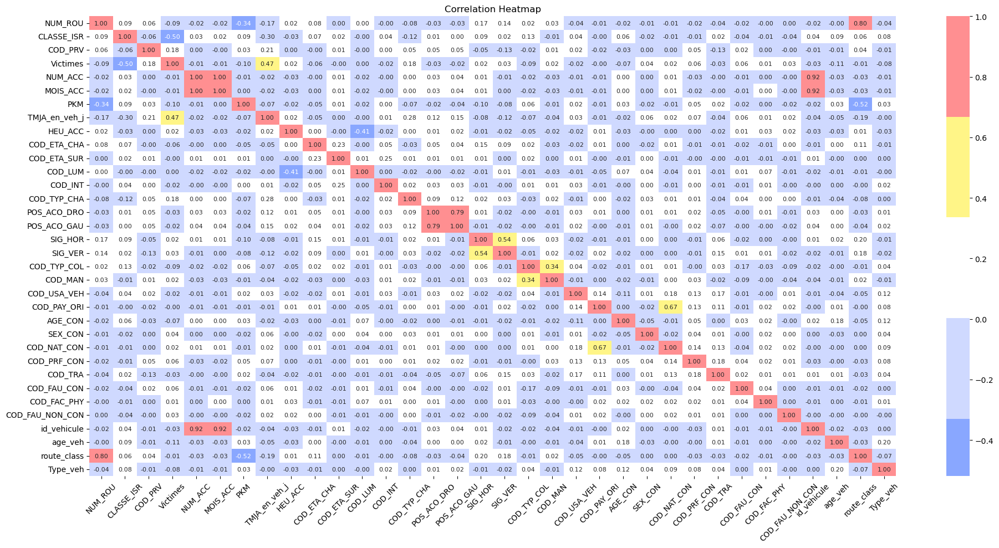

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
blue_palette = sns.color_palette(["#3370ff", "#89a7ff", "#cfd9ff", "#ffffff", "#fff587", "#ff8f91"])
df = pd.read_csv('merged_data22054.csv')
corr_matrix = df.corr()
corr_matrix = corr_matrix.fillna(0)
plt.figure(figsize=(20, 10))
sns.heatmap(corr_matrix, annot=True, cmap=blue_palette, fmt=".2f", annot_kws={"size": 8}, center=0)
plt.title('Correlation Heatmap')
plt.xticks(rotation=45) 
plt.yticks(rotation=0)
plt.tight_layout() 
plt.savefig('correlation_heatmap_before_high_res.png', dpi=300, format='png', bbox_inches='tight')
plt.show()

## FEATURE SELECTION :anova test

In [14]:
import pandas as pd
from sklearn.feature_selection import SelectKBest, f_classif

# Load the data
df = pd.read_csv('merged_data22054.csv')
exclude_columns = ['CLASSE_ISR', 'POS_ACO_GAU','POS_ACO_DRO','COD_ETA_CHA']  
X = df.drop(columns=exclude_columns, errors='ignore') 
y = df['CLASSE_ISR']
selector = SelectKBest(score_func=f_classif, k=14)
X_selected = selector.fit_transform(X, y)

selected_indices = selector.get_support(indices=True)
selected_features = X.columns[selected_indices].to_list()
essential_features = ['NUM_ACC', 'PKM','COD_LUM', 'COD_PRV','NUM_ROU','id_vehicule','HEU_ACC','MOIS_ACC','COD_PRF_CON','COD_USA_VEH']
for feature in essential_features:
    if feature not in selected_features:
        selected_features.append(feature)
selected_df = pd.DataFrame(X_selected, columns=X.columns[selected_indices])
for feature in essential_features:
    selected_df[feature] = df[feature].values
selected_df['CLASSE_ISR'] = y.values
selected_df = selected_df.astype('int64')
selected_df.to_csv('selected_features_ANOVA_8.csv', index=False)
print("Selected features based on ANOVA F-test:")
print(selected_features)
selected_df.info()


Selected features based on ANOVA F-test:
['NUM_ROU', 'COD_PRV', 'Victimes', 'PKM', 'TMJA_en_veh_j', 'COD_TYP_CHA', 'SIG_HOR', 'SIG_VER', 'COD_TYP_COL', 'AGE_CON', 'COD_TRA', 'age_veh', 'route_class', 'Type_veh', 'NUM_ACC', 'COD_LUM', 'id_vehicule', 'HEU_ACC', 'MOIS_ACC', 'COD_PRF_CON', 'COD_USA_VEH']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23309 entries, 0 to 23308
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   NUM_ROU        23309 non-null  int64
 1   COD_PRV        23309 non-null  int64
 2   Victimes       23309 non-null  int64
 3   PKM            23309 non-null  int64
 4   TMJA_en_veh_j  23309 non-null  int64
 5   COD_TYP_CHA    23309 non-null  int64
 6   SIG_HOR        23309 non-null  int64
 7   SIG_VER        23309 non-null  int64
 8   COD_TYP_COL    23309 non-null  int64
 9   AGE_CON        23309 non-null  int64
 10  COD_TRA        23309 non-null  int64
 11  age_veh        23309 non-null  int64
 

In [17]:
selected_df.corr()

,NUM_ROU,COD_PRV,Victimes,PKM,TMJA_en_veh_j,COD_TYP_CHA,SIG_HOR,SIG_VER,COD_TYP_COL,AGE_CON,...,route_class,Type_veh,NUM_ACC,COD_LUM,id_vehicule,HEU_ACC,MOIS_ACC,COD_PRF_CON,COD_USA_VEH,CLASSE_ISR
NUM_ROU,1.000000,0.061243,-0.091933,-0.335204,-0.169873,-0.080023,0.173439,0.138519,0.023473,-0.021512,...,0.795996,-0.036296,-0.022615,0.003846,-0.018303,0.015685,-0.022456,-0.022425,-0.039627,0.093997
COD_PRV,0.061243,1.000000,0.177149,0.027221,0.206965,0.045944,-0.047955,-0.134281,-0.024019,-0.029004,...,0.038493,-0.005892,0.001682,-0.000883,-0.006234,0.001280,-0.002615,0.053468,0.019154,-0.061772
Victimes,-0.091933,0.177149,1.000000,-0.097759,0.471811,0.176481,0.021333,0.031070,-0.092030,-0.066938,...,-0.009118,-0.079063,-0.012051,0.000804,-0.029665,0.022010,-0.007716,0.061410,-0.018914,-0.502107
PKM,-0.335204,0.027221,-0.097759,1.000000,-0.068828,-0.069267,-0.098680,-0.083973,0.062898,0.032299,...,-0.519496,0.029787,-0.008365,-0.015951,-0.021151,-0.015052,0.000197,0.051863,0.019940,0.085839
TMJA_en_veh_j,-0.169873,0.206965,0.471811,-0.068828,1.000000,0.284535,-0.075401,-0.118672,-0.072695,-0.023311,...,-0.189433,-0.002500,-0.022744,-0.000784,-0.037722,0.015221,-0.021549,0.068936,0.025797,-0.301700
COD_TYP_CHA,-0.080023,0.045944,0.176481,-0.069267,0.284535,1.000000,0.022360,0.032837,-0.028513,-0.022204,...,-0.080867,0.001224,0.003613,-0.018124,-0.006326,0.003191,0.004872,0.005101,-0.010206,-0.116466
SIG_HOR,0.173439,-0.047955,0.021333,-0.098680,-0.075401,0.022360,1.000000,0.537405,0.061180,-0.005998,...,0.202933,-0.010635,0.013061,-0.013850,0.005198,-0.014799,0.014037,-0.011342,-0.018735,0.091995
SIG_VER,0.138519,-0.134281,0.031070,-0.083973,-0.118672,0.032837,0.537405,1.000000,-0.011393,-0.018677,...,0.176368,-0.019703,-0.007950,0.011277,-0.016910,-0.021553,0.000374,-0.007088,-0.017388,0.021868
COD_TYP_COL,0.023473,-0.024019,-0.092030,0.062898,-0.072695,-0.028513,0.061180,-0.011393,1.000000,-0.008222,...,-0.008010,0.037647,-0.019316,-0.014999,-0.018895,-0.054305,-0.020562,-0.000382,0.036642,0.128968
AGE_CON,-0.021512,-0.029004,-0.066938,0.032299,-0.023311,-0.022204,-0.005998,-0.018677,-0.008222,1.000000,...,-0.046410,0.115044,0.003785,0.068309,0.017592,-0.033750,0.003541,0.052786,-0.106151,0.059903


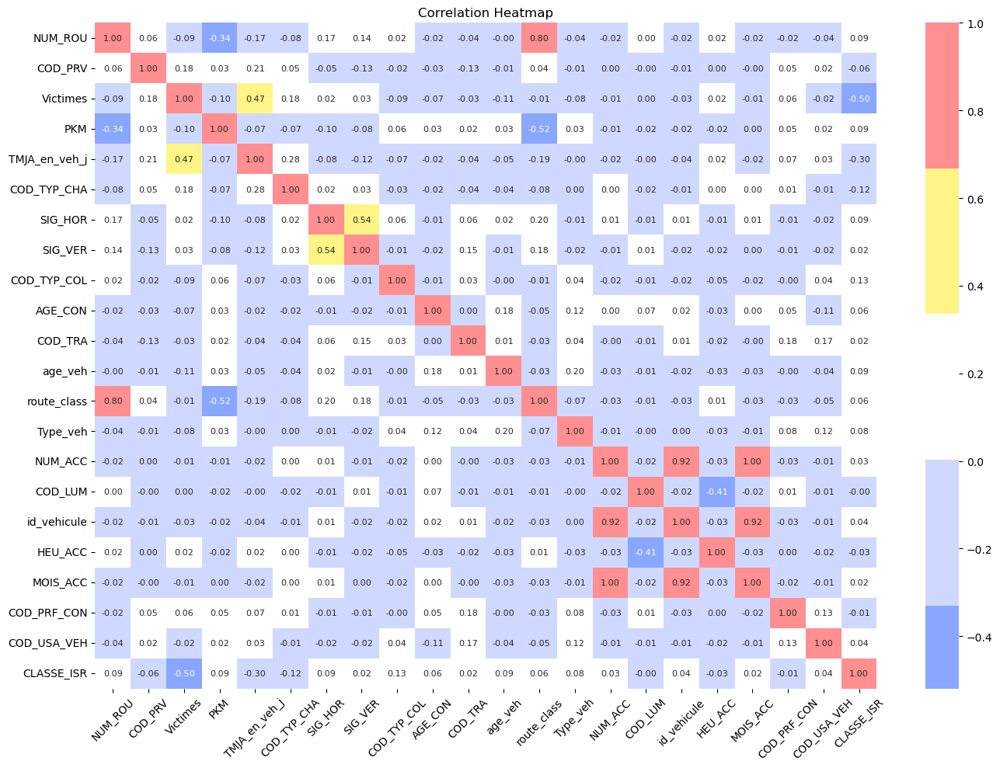

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
blue_palette = sns.color_palette(["#3370ff", "#89a7ff", "#cfd9ff", "#ffffff", "#fff587", "#ff8f91"])
df = pd.read_csv('selected_features_ANOVA_8.csv')
corr_matrix = df.corr()
corr_matrix = corr_matrix.fillna(0)
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, cmap=blue_palette, fmt=".2f", annot_kws={"size": 8}, center=0)
plt.title('Correlation Heatmap')
plt.xticks(rotation=45) 
plt.yticks(rotation=0)
plt.tight_layout() 
plt.savefig('correlation_heatmap_after_high_res.png', dpi=300, format='png', bbox_inches='tight')
plt.show()

In [21]:
df.describe()

,NUM_ROU,COD_PRV,Victimes,PKM,TMJA_en_veh_j,COD_TYP_CHA,SIG_HOR,SIG_VER,COD_TYP_COL,AGE_CON,...,route_class,Type_veh,NUM_ACC,COD_LUM,id_vehicule,HEU_ACC,MOIS_ACC,COD_PRF_CON,COD_USA_VEH,CLASSE_ISR
count,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,...,23309.000000,23309.000000,23309.000000,23309.000000,2.330900e+04,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000
mean,662.095500,32.287700,92.671200,187.249818,8436.720237,1.106997,1.155047,1.226908,4.252349,39.732550,...,1.628942,2.393668,24512.553520,1.620833,1.862094e+06,14.630486,6.782016,6.700888,1.495174,1.882964
std,1320.522773,20.954787,117.577967,250.475347,9308.927685,0.309116,0.361958,0.418842,2.586513,14.158325,...,0.773347,1.835753,13172.807787,0.485190,5.606353e+04,5.330892,3.266267,1.849802,2.515293,1.208536
min,1.000000,2.000000,0.000000,0.000000,77.000000,1.000000,1.000000,1.000000,1.000000,6.000000,...,1.000000,0.000000,3.000000,1.000000,1.786912e+06,0.000000,1.000000,0.000000,0.000000,1.000000
25%,4.000000,14.000000,11.000000,18.000000,2873.000000,1.000000,1.000000,1.000000,2.000000,29.000000,...,1.000000,1.000000,13340.000000,1.000000,1.804635e+06,11.000000,4.000000,6.000000,0.000000,1.000000
50%,13.000000,27.000000,41.000000,72.000000,4893.000000,1.000000,1.000000,1.000000,3.000000,37.000000,...,1.000000,3.000000,25917.000000,2.000000,1.872331e+06,15.000000,7.000000,6.000000,0.000000,1.000000
75%,404.000000,50.000000,125.000000,290.000000,10456.000000,1.000000,1.000000,1.000000,7.000000,49.000000,...,2.000000,3.000000,34355.000000,2.000000,1.915847e+06,19.000000,9.000000,9.000000,4.000000,3.000000
max,7319.000000,74.000000,597.000000,1992.000000,79083.000000,2.000000,2.000000,2.000000,8.000000,80.000000,...,3.000000,99.000000,46296.000000,2.000000,1.953407e+06,23.000000,12.000000,9.000000,9.000000,4.000000


## Visualise outliers

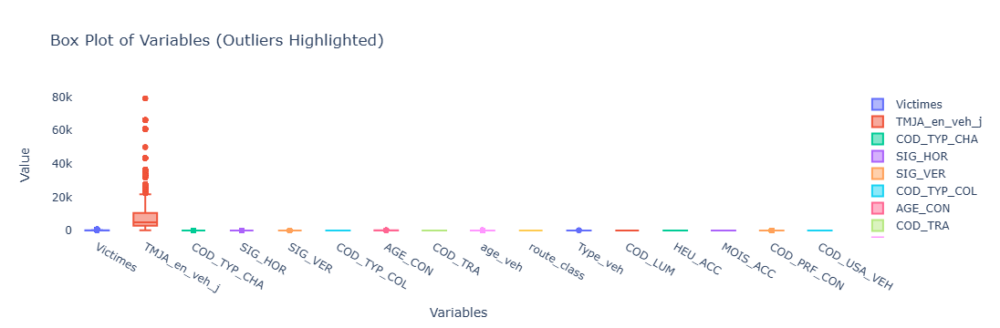

In [126]:
import plotly.graph_objects as go
import pandas as pd

df = pd.read_csv('selected_features_ANOVA_8.csv')

excluded_columns = ['NUM_ROU', 'COD_PRV', 'NUM_ACC','CLASSE_ISR', 'id_vehicule', 'PKM']
filtered_df = df.drop(columns=excluded_columns)
fig = go.Figure()
for column in filtered_df.columns:
    fig.add_trace(go.Box(y=filtered_df[column], name=column, boxpoints='outliers'))

fig.update_layout(
    title="Box Plot of Variables (Outliers Highlighted)",
    yaxis_title="Value",
    xaxis_title="Variables",
    plot_bgcolor='white'
)

fig.show()
fig.write_image("OUTLIERS.png", scale=4) 


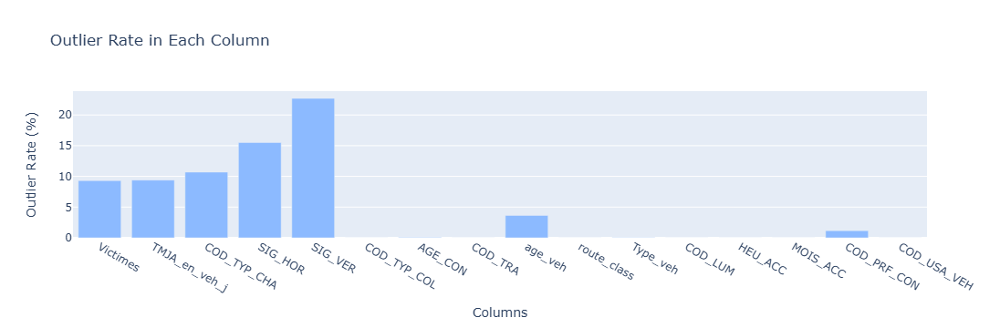

In [24]:
import plotly.graph_objects as go
import pandas as pd

df = pd.read_csv('selected_features_ANOVA_8.csv')
excluded_columns = ['NUM_ROU', 'COD_PRV', 'NUM_ACC', 'id_vehicule', 'CLASSE_ISR', 'PKM']  
all_columns_except_num_acc = [col for col in df.columns if col != 'NUM_ACC']
outlier_rates = {}

def calculate_outliers(data, col_list):
    total_rows = len(data)
    for col in col_list:
        if col not in excluded_columns:
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            IQR = Q3 - Q1
            bounds = [Q1 - 1.5 * IQR, Q3 + 1.5 * IQR]
            outliers = data[col][(data[col] < bounds[0]) | (data[col] > bounds[1])]
            outlier_rate = len(outliers) / total_rows * 100  # Convert to percentage
            outlier_rates[col] = outlier_rate

calculate_outliers(df, all_columns_except_num_acc)

color = '#8cbaff'
fig_bar = go.Figure(data=[
    go.Bar(name='Outlier Rate (%)', marker_color=color, x=list(outlier_rates.keys()), y=list(outlier_rates.values()))
])

fig_bar.update_layout(
    title='Outlier Rate in Each Column',
    xaxis_title='Columns',
    yaxis_title='Outlier Rate (%)'
)
fig_bar.show()
fig_bar.write_image("OUTLIERRATE.png", scale=4)  



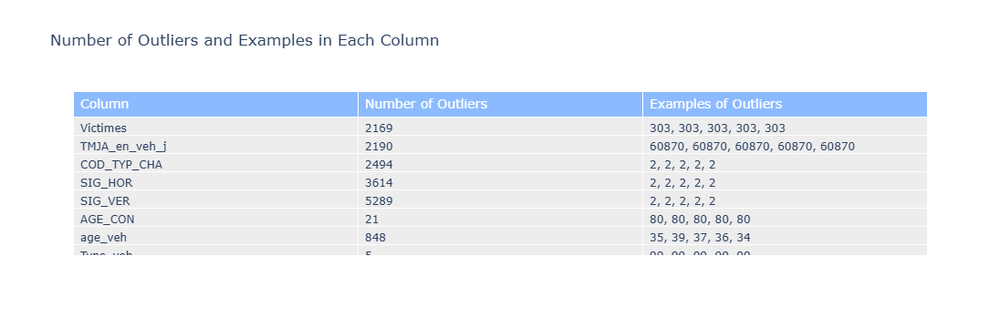

In [1]:
import pandas as pd
import plotly.graph_objects as go

df = pd.read_csv('selected_features_ANOVA_8.csv')
excluded_columns = ['NUM_ROU', 'COD_PRV', 'NUM_ACC', 'CLASSE_ISR', 'id_vehicule', 'PKM']
columns = []
outlier_counts = []
outlier_examples = []

for column in df.columns:
    if column in excluded_columns or df[column].dtype.kind not in 'bifc':
        continue
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[column][(df[column] < lower_bound) | (df[column] > upper_bound)]
    if not outliers.empty:
        example_outliers = outliers.head(5)
        example_str = ', '.join([f"{x:.2f}" if isinstance(x, float) else str(x) for x in example_outliers])
        columns.append(column)
        outlier_counts.append(len(outliers))
        outlier_examples.append(example_str)

if columns:
    fig = go.Figure(data=[go.Table(
        header=dict(values=['Column', 'Number of Outliers', 'Examples of Outliers'],
                    fill_color='#8cbaff',
                    font=dict(color='white', size=14),
                    align='left'),
        cells=dict(values=[columns, outlier_counts, outlier_examples],
                   fill_color='#ededed',
                   align='left'))
    ])

    total_rows = len(columns)
    calculated_height = max(500, 30 * total_rows + 100)
    fig.update_layout(title='Number of Outliers and Examples in Each Column', height=calculated_height)
    fig.show()
else:
    print("No outliers found in the columns considered.")
fig.write_image("OUTLIERSSAMPLES.png", scale=4) 


Interprétation du diagramme en boîte :
Données originales : Le diagramme en boîte affiche un point aberrant significatif, très éloigné de la majorité des points de données dans la colonne cod_typ_veh. Ce point aberrant est bien plus élevé que le reste et peut représenter des données erronées ou un cas particulier.
Données après suppression des valeurs aberrantes : Les données nettoyées montrent une distribution plus uniforme sans le point aberrant extrême. La plage est plus étroite, et la distribution des données semble plus typique pour des données catégoriques, ce qui est courant dans des caractéristiques comme cod_typ_veh qui représentent souvent des types ou des catégories.

Interprétation de l'histogramme :
Histogramme des données originales : L'histogramme révèle une distribution très concentrée dans une catégorie inférieure avec très peu de comptages s'étendant vers des catégories supérieures. Il y a un point aberrant significatif dans la catégorie la plus élevée. Cela indique que la plupart des données pour cod_typ_veh se situent dans une plage limitée de valeurs inférieures, suggérant que ce sont les types de véhicules les plus courants dans votre ensemble de données.
Histogramme après suppression des valeurs aberrantes : L'histogramme post-nettoyage affiche une distribution discrète, typique pour des données catégoriques. La majorité des données est concentrée dans les catégories 1 à 3, avec très peu d'instances dans les catégories 4 à 6. Ce nettoyage a efficacement éliminé le point aberrant extrême, et maintenant la distribution se concentre sur les catégories de base qui représentent l'essentiel des données.

Interprétation et actions supplémentaires :
Concentration des données : La suppression des valeurs aberrantes permet aux données restantes de mieux représenter les catégories "typiques" observées dans l'ensemble de données, ce qui peut améliorer les analyses statistiques et les modèles d'apprentissage automatique en réduisant l'influence des valeurs extrêmes.
Impact des valeurs aberrantes : La présence de valeurs aberrantes aurait pu fausser les analyses, telles que les calculs de moyenne ou de variance, et aurait pu avoir une influence indue sur les modèles d'apprentissage automatique, en particulier ceux sensibles aux valeurs aberrantes comme la régression linéaire ou le regroupement.
Validation : Il est essentiel de valider pourquoi les valeurs aberrantes étaient présentes initialement. S'agissait-il d'erreurs de saisie de données, de cas inhabituels mais valides, ou d'autres raisons ? Comprendre cela peut aider à prendre des décisions concernant les stratégies de nettoyage des données.